<table class="table table-bordered">
    <tr>
        <th style="text-align:center; vertical-align: middle; width:50%"><img src='https://www.np.edu.sg/images/default-source/default-album/img-logo.png'"></th>
        <th style="text-align:center;"><h1>Deep Learning</h1><h2>Assignment 1 - Food Classification Model (Individual)</h2><h3>AY2023/24 Semester</h3></th>
    </tr>
</table>

# Table of Contents
* [Import and Load Necessary Packages](#Import-and-Load-Necessary-Packages)
* [Step 1: Data Loading](#Step-1:-Data-Loading)
* [Step 2: Develop the Image Classification Models](#Step-2:-Develop-the-Image-Classification-Models)
* [Step 3 – Evaluate the Developed Models using Testing Images (Model 1)](#Step-3-–-Evaluate-the-Developed-Models-using-Testing-Images-(Model-1))
* [Step 3 – Evaluate the Developed Models using Testing Images (Model 2)](#Step-3-–-Evaluate-the-Developed-Models-using-Testing-Images-(Model-1))
* [Step 4  – Use the best model to make prediction](#Step-4--–-Use-the-best-model-to-make-prediction)

## Import and Load Necessary Packages

In [1]:
# Import the Required Packages
from tensorflow import keras
print('keras: ', keras.__version__)
# Keras version must be at least 2.6.0
import os
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plt
%matplotlib inline
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import os
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
from pathlib import Path
import os.path
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
import tensorflow as tf
from sklearn.metrics import classification_report

keras:  3.6.0


## Step 1: Data Loading

In [2]:
# path to your downloaded file (important!!) (assignment!!)
base_dir = 'C:\\Users\\tswr1\\OneDrive - Ngee Ann Polytechnic\\NP\\Y2.2\\DL\\Assignment 1\\food_archive_images\\images\\'

train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

In [3]:
# Check if directories exist
for dir_path in [train_dir, validation_dir, test_dir]:
    if not os.path.exists(dir_path):
        raise FileNotFoundError(f"Directory {dir_path} does not exist.")

## Step 2:  Develop the Image Classification Models

### Model #1

In [4]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

img_size = 150
# new augmentation code that i experimented with

# Learned and Referenced from:
# https://www.restack.io/p/data-augmentation-answer-keras-example-cat-ai
# https://github.com/keras-team/keras-preprocessing/blob/master/keras_preprocessing/image/image_data_generator.py    

datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,            # Reduced the rotation as compared to the original code
    width_shift_range=0.2,        # Shifted horizontally to make sure the main thing in the picture is shown
    height_shift_range=0.2,       # Shifted vertically to make sure the main thing in the picture is shown
    shear_range=0.1,              # Reduced shear so that it works for slanted images
    zoom_range=0.15,              # Average zoom so that the image isnt too focused
    horizontal_flip=True,         # Flip images horizontally so that we can 
    brightness_range=[0.8, 1.2],  # Adjust the Brightness for better learning
    fill_mode='reflect')          # Reflects the pixels

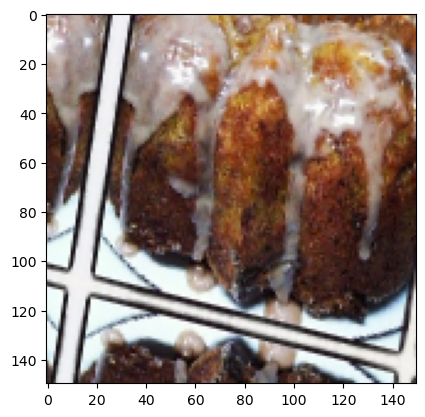

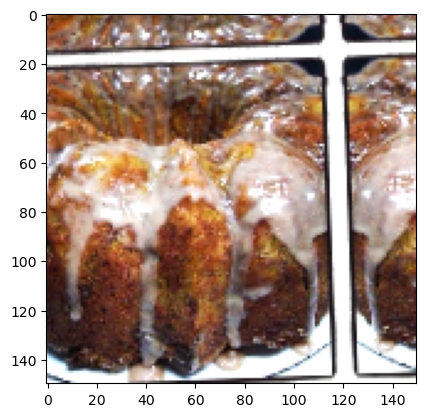

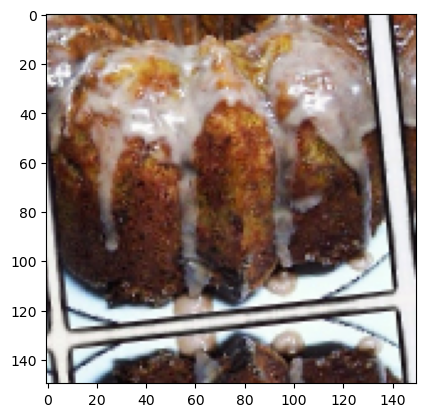

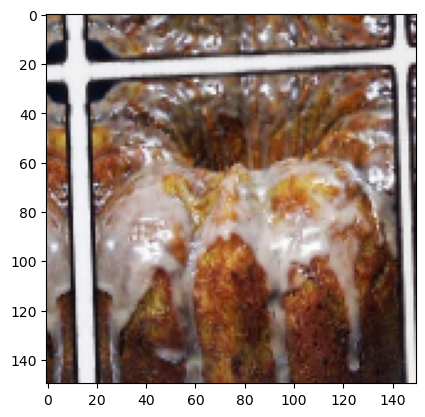

In [5]:
# Bread Pudding Data Augmentation
# This is module with image preprocessing utilities
import os
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image

train_breadpudding_dir = os.path.join(base_dir, 'train/bread_pudding')

fnames = [os.path.join(train_breadpudding_dir, fname) for fname in os.listdir(train_breadpudding_dir)]

# We pick one image to "augment"
img_path = fnames[3]

# Read the image and resize it
img = image.load_img(img_path, target_size=(img_size, img_size))

# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
        

plt.show()

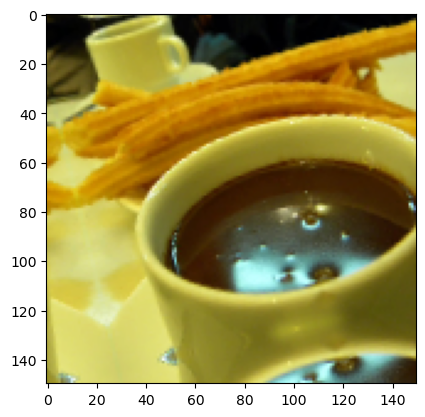

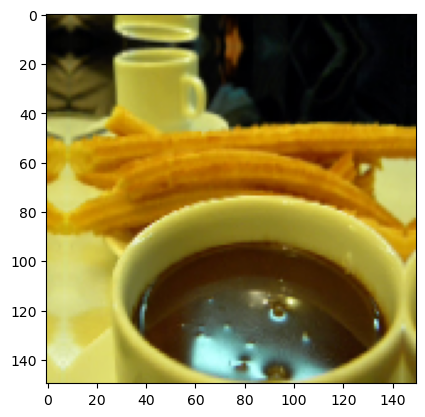

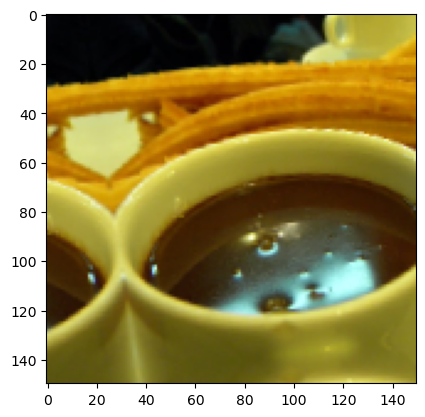

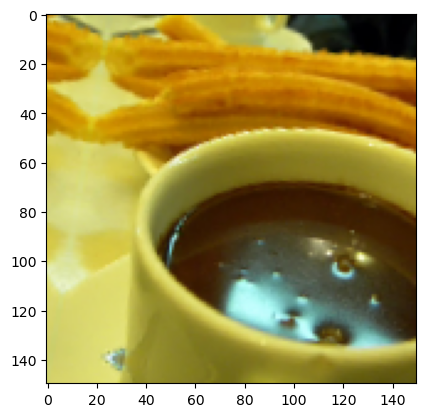

In [6]:
# Churros Data Augmentation
# This is module with image preprocessing utilities
import os
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image
train_churros_dir = os.path.join(base_dir, 'train/churros')

fnames = [os.path.join(train_churros_dir, fname) for fname in os.listdir(train_churros_dir)]

# We pick one image to "augment"
img_path = fnames[3]

# Read the image and resize it
img = image.load_img(img_path, target_size=(img_size, img_size))

# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
        

plt.show()

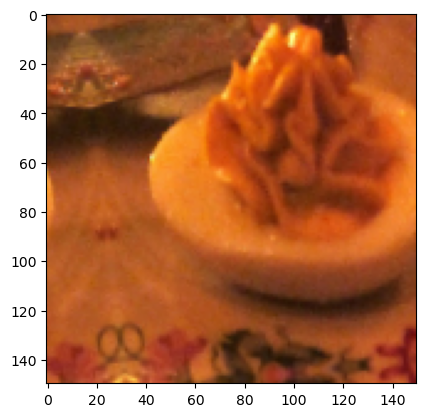

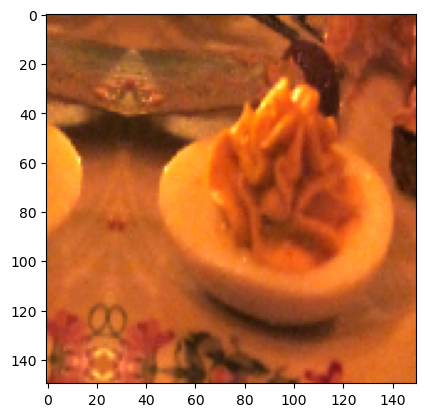

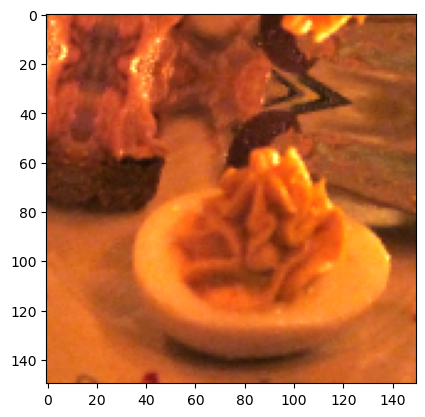

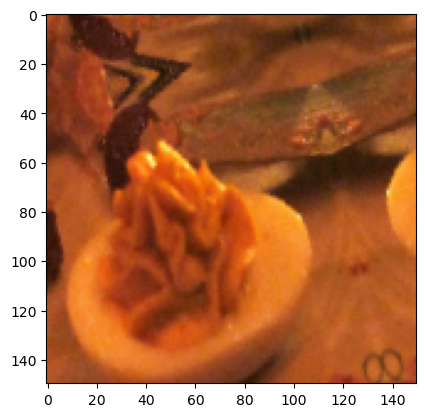

In [7]:
# Deviled Eggs Data Augmentation
# This is module with image preprocessing utilities
import os
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image
train_deviledeggs_dir = os.path.join(base_dir, 'train/deviled_eggs')

fnames = [os.path.join(train_deviledeggs_dir, fname) for fname in os.listdir(train_deviledeggs_dir)]

# We pick one image to "augment"
img_path = fnames[3]

# Read the image and resize it
img = image.load_img(img_path, target_size=(img_size, img_size))

# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
        

plt.show()

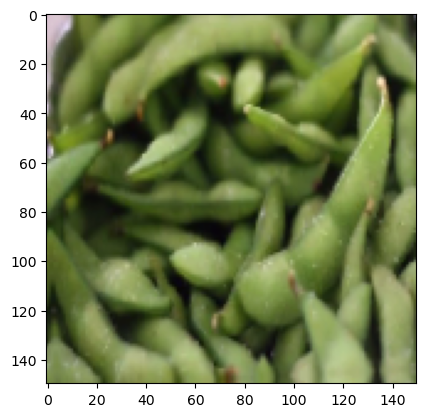

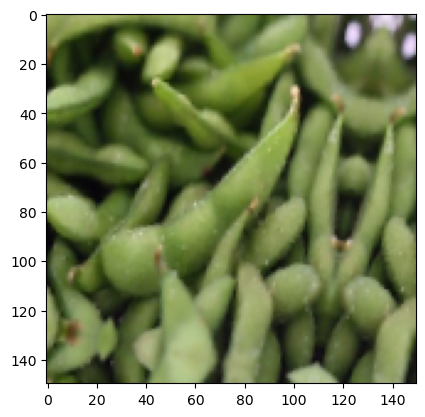

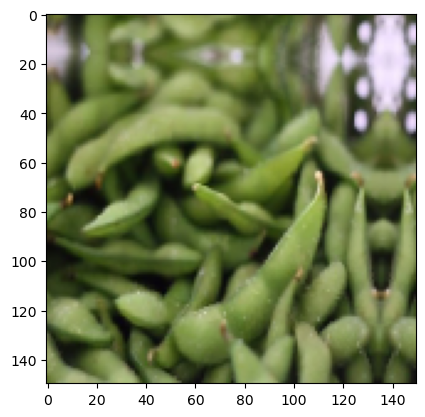

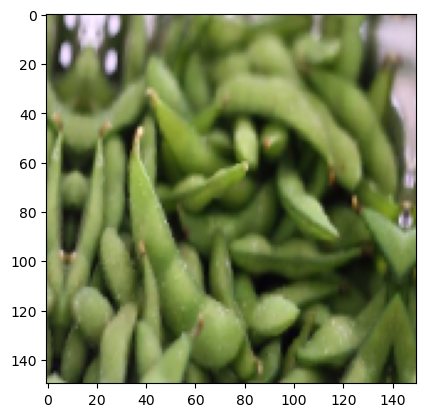

In [8]:
# Edamame Data Augmentation
# This is module with image preprocessing utilities
import os
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image
train_edamame_dir = os.path.join(base_dir, 'train/edamame')

fnames = [os.path.join(train_edamame_dir, fname) for fname in os.listdir(train_edamame_dir)]

# We pick one image to "augment"
img_path = fnames[3]

# Read the image and resize it
img = image.load_img(img_path, target_size=(img_size, img_size))

# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
        

plt.show()

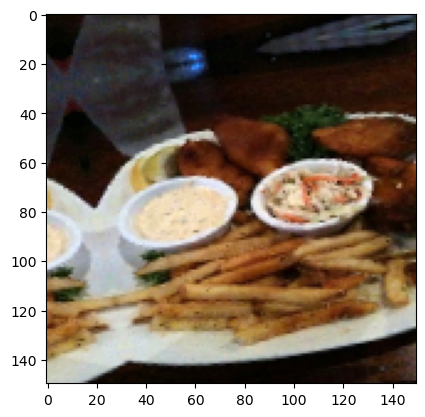

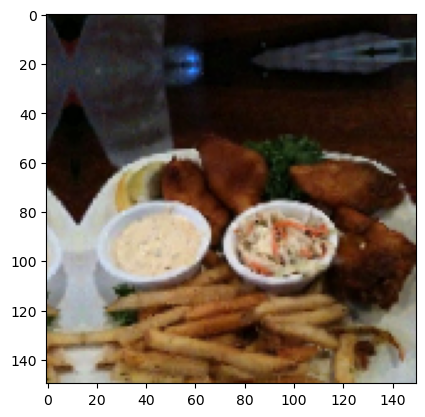

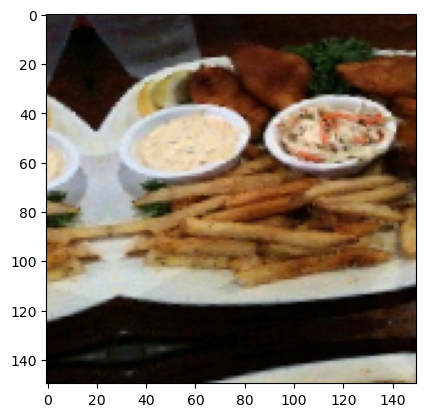

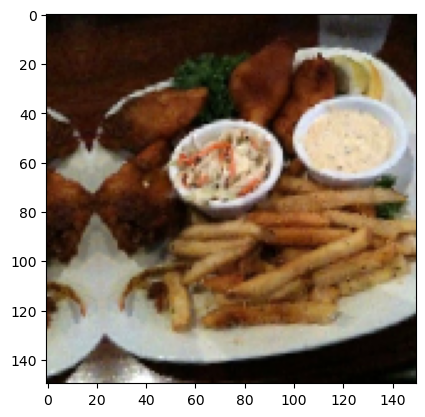

In [9]:
# Fish and Chips Data Augmentation
# This is module with image preprocessing utilities
import os
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image
train_fishandchips_dir = os.path.join(base_dir, 'train/fish_and_chips')

fnames = [os.path.join(train_fishandchips_dir, fname) for fname in os.listdir(train_fishandchips_dir)]

# We pick one image to "augment"
img_path = fnames[3]

# Read the image and resize it
img = image.load_img(img_path, target_size=(img_size, img_size))

# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
        

plt.show()

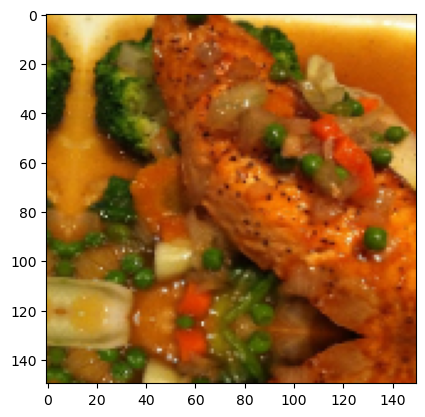

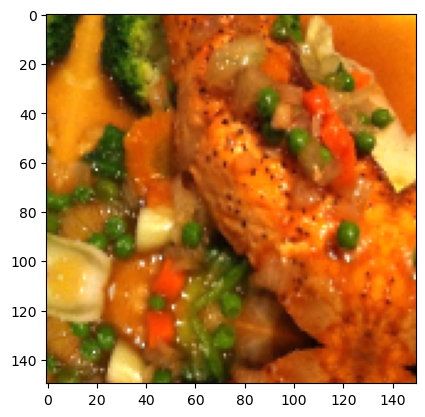

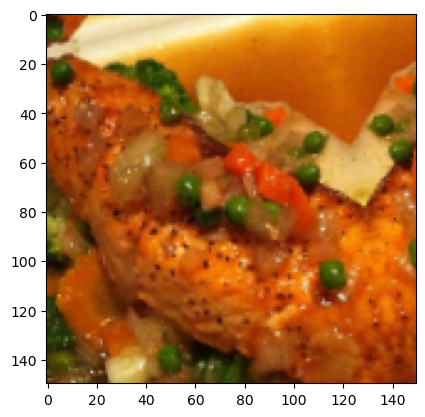

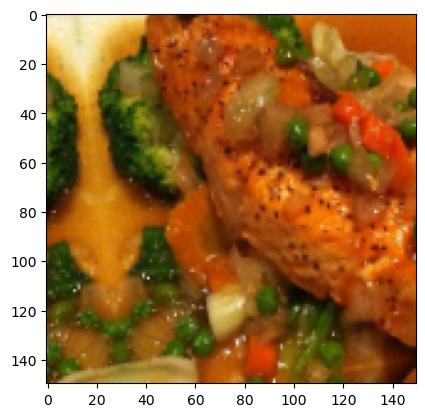

In [10]:
# Grilled Salmon Data Augmentation
# This is module with image preprocessing utilities
import os
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image
train_grilledsalmon_dir = os.path.join(base_dir, 'train/grilled_salmon')

fnames = [os.path.join(train_grilledsalmon_dir, fname) for fname in os.listdir(train_grilledsalmon_dir)]

# We pick one image to "augment"
img_path = fnames[3]

# Read the image and resize it
img = image.load_img(img_path, target_size=(img_size, img_size))

# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
        

plt.show()

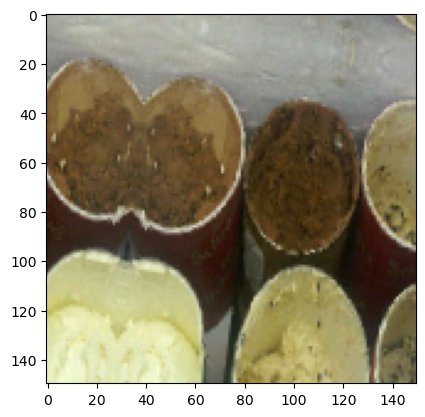

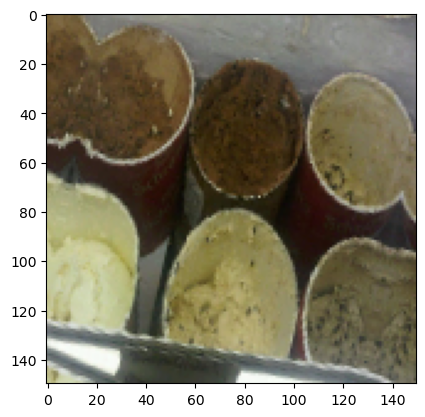

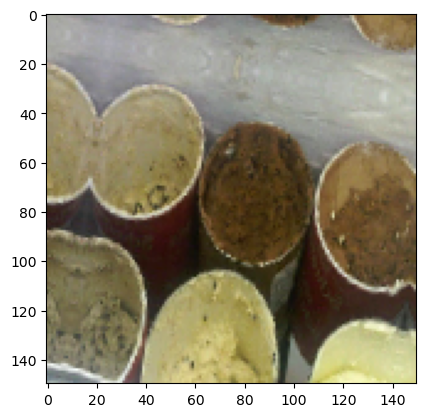

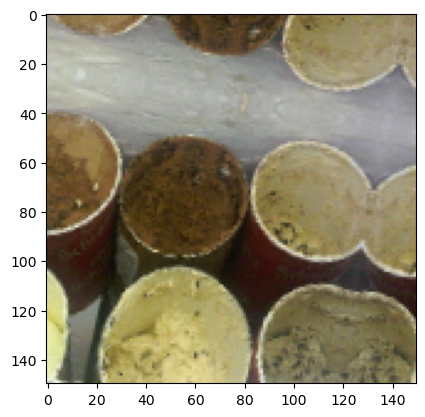

In [11]:
# Ice Cream Data Augmentation
# This is module with image preprocessing utilities
import os
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image
train_icecream_dir = os.path.join(base_dir, 'train/ice_cream')

fnames = [os.path.join(train_icecream_dir, fname) for fname in os.listdir(train_icecream_dir)]

# We pick one image to "augment"
img_path = fnames[3]

# Read the image and resize it
img = image.load_img(img_path, target_size=(img_size, img_size))

# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
        

plt.show()

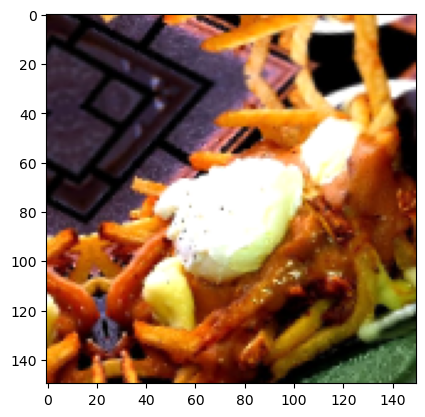

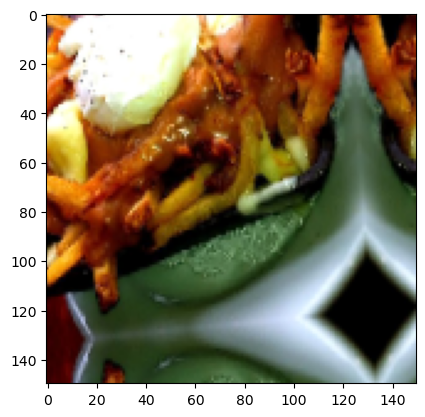

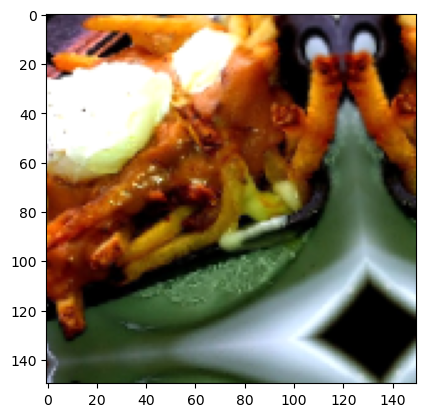

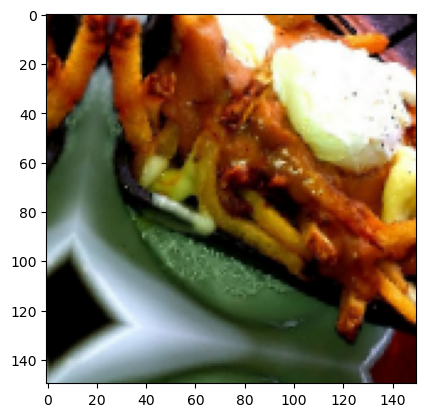

In [12]:
# Poutine Data Augmentation
# This is module with image preprocessing utilities
import os
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image
train_poutine_dir = os.path.join(base_dir, 'train/poutine')

fnames = [os.path.join(train_poutine_dir, fname) for fname in os.listdir(train_poutine_dir)]

# We pick one image to "augment"
img_path = fnames[3]

# Read the image and resize it
img = image.load_img(img_path, target_size=(img_size, img_size))

# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
        

plt.show()

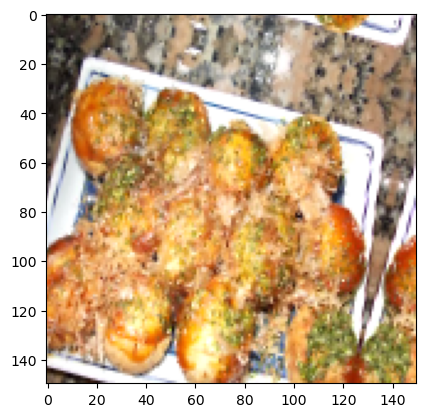

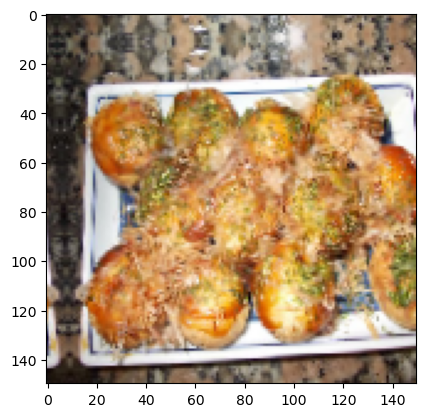

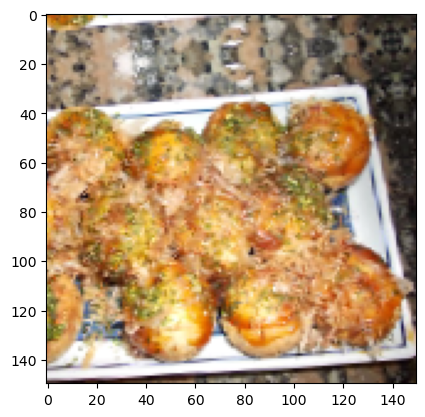

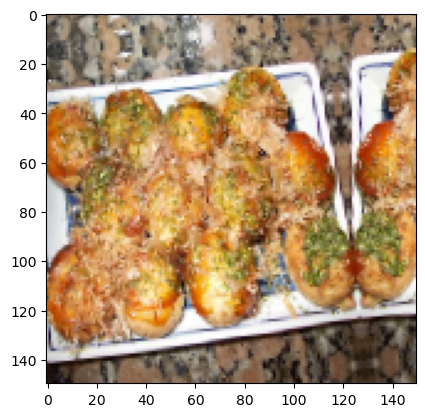

In [13]:
# Takoyaki Data Augmentation
# This is module with image preprocessing utilities
import os
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image
train_takoyaki_dir = os.path.join(base_dir, 'train/takoyaki')

fnames = [os.path.join(train_takoyaki_dir, fname) for fname in os.listdir(train_takoyaki_dir)]

# We pick one image to "augment"
img_path = fnames[3]

# Read the image and resize it
img = image.load_img(img_path, target_size=(img_size, img_size))

# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
        

plt.show()

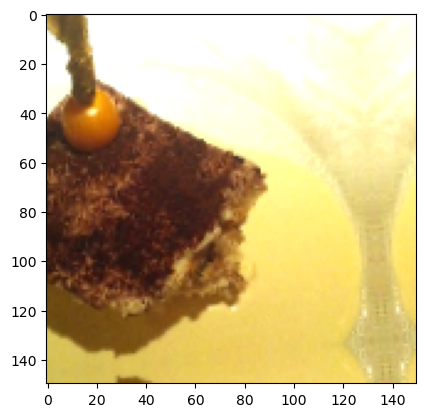

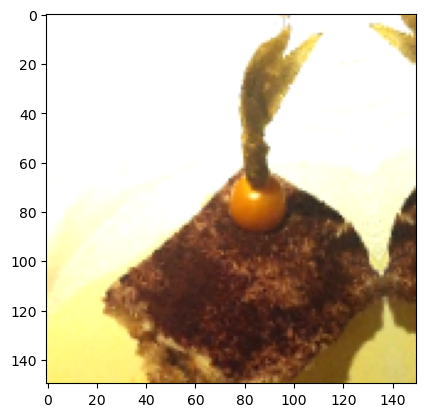

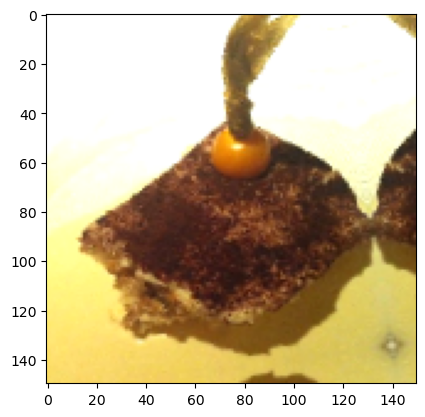

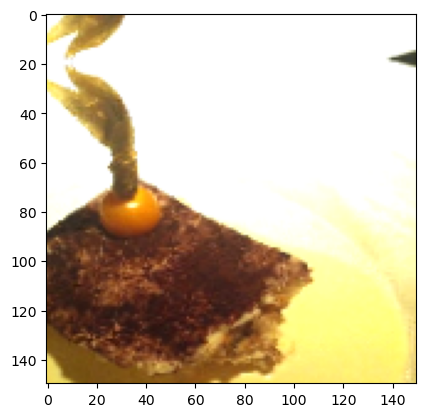

In [14]:
# Tiramisu Data Augmentation
# This is module with image preprocessing utilities
import os
import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing import image
train_tiramisu_dir = os.path.join(base_dir, 'train/tiramisu')

fnames = [os.path.join(train_tiramisu_dir, fname) for fname in os.listdir(train_tiramisu_dir)]

# We pick one image to "augment"
img_path = fnames[3]

# Read the image and resize it
img = image.load_img(img_path, target_size=(img_size, img_size))

# Convert it to a Numpy array with shape (150, 150, 3)
x = image.img_to_array(img)

# Reshape it to (1, 150, 150, 3)
x = x.reshape((1,) + x.shape)

# The .flow() command below generates batches of randomly transformed images.
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
    plt.figure(i)
    imgplot = plt.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 4 == 0:
        break
        

plt.show()

In [15]:
model = models.Sequential()
model.add(keras.Input(shape=(img_size, img_size, 3)))
model.add(layers.Conv2D(32, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(64, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu'))
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Conv2D(128, (3, 3), activation='relu')) # new layer added but same filter size 3x3
model.add(layers.MaxPooling2D((2, 2)))
model.add(layers.Flatten())
model.add(layers.Dropout(0.5))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dense(10, activation='softmax')) # changed to softmax 10 for classification of 10 different food items

model.compile(loss='categorical_crossentropy', # categorical for multi classification
              optimizer=optimizers.RMSprop(learning_rate=2*1e-4),
              metrics=['acc'])

In [16]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 148, 148, 32)        │             896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 74, 74, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 72, 72, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 36, 36, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 34, 34, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 17, 17, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 15, 15, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 7, 7, 128)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 6272)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       3,211,776 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           5,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,457,738 (13.19 MB)

 Trainable params: 3,457,738 (13.19 MB)

 Non-trainable params: 0 (0.00 B)

In [17]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(img_size, img_size),
        batch_size=20,
        # Since we use categorical_crossentropy loss, we need categorical labels
        class_mode='categorical') # categorical for multi classification

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical') # categorical for multi classification

history = model.fit(
      train_generator,
      epochs=100,
      validation_data=validation_generator)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


C:\Users\tswr1\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 232s 607ms/step - acc: 0.1855 - loss: 2.1796 - val_acc: 0.3115 - val_loss: 1.9133
Epoch 2/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 227s 605ms/step - acc: 0.2787 - loss: 1.9572 - val_acc: 0.3220 - val_loss: 1.8731
Epoch 3/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 224s 597ms/step - acc: 0.3148 - loss: 1.8766 - val_acc: 0.3340 - val_loss: 1.8710
Epoch 4/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 237s 631ms/step - acc: 0.3475 - loss: 1.8057 - val_acc: 0.3575 - val_loss: 1.8199
Epoch 5/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 230s 612ms/step - acc: 0.3604 - loss: 1.7619 - val_acc: 0.4075 - val_loss: 1.7357
Epoch 6/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 220s 587ms/step - acc: 0.3719 - loss: 1.7315 - val_acc: 0.4170 - val_loss: 1.6522
Epoch 7/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 227s 604ms/step - acc: 0.4082 - loss: 1.6833 - val_acc: 0.4540 - val_loss: 1.5878
Epoch 8/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 192s 512ms/step - acc: 0.4206 - loss: 1.6378 - val_acc: 0.4670 - val_loss: 1.5357
Epoch 9/100
375/

Epoch 53/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 173s 462ms/step - acc: 0.7100 - loss: 0.8803 - val_acc: 0.7080 - val_loss: 0.9089
Epoch 54/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 170s 454ms/step - acc: 0.7128 - loss: 0.8647 - val_acc: 0.6375 - val_loss: 1.1866
Epoch 55/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 162s 431ms/step - acc: 0.7143 - loss: 0.8761 - val_acc: 0.7040 - val_loss: 0.8871
Epoch 56/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 162s 432ms/step - acc: 0.7106 - loss: 0.8510 - val_acc: 0.6965 - val_loss: 0.9034
Epoch 57/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 172s 459ms/step - acc: 0.7107 - loss: 0.8623 - val_acc: 0.6815 - val_loss: 0.9693
Epoch 58/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 172s 458ms/step - acc: 0.7192 - loss: 0.8299 - val_acc: 0.7075 - val_loss: 0.9277
Epoch 59/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 167s 444ms/step - acc: 0.7165 - loss: 0.8420 - val_acc: 0.6810 - val_loss: 0.9909
Epoch 60/100
375/375 ━━━━━━━━━━━━━━━━━━━━ 160s 427ms/step - acc: 0.7089 - loss: 0.8610 - val_acc: 0.7155 - val_loss: 0.9078
Epoch 61

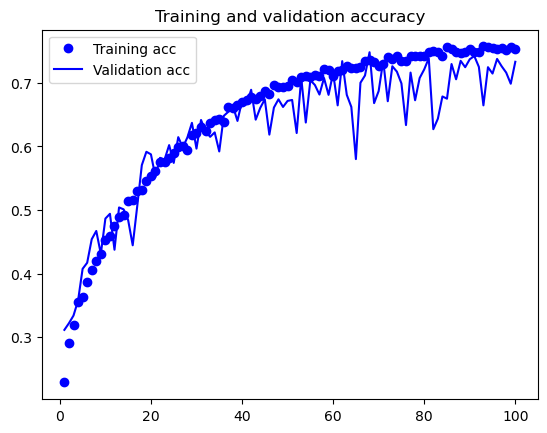

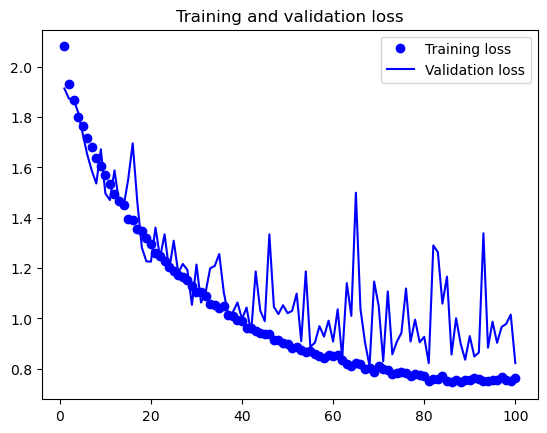

In [18]:
# Plot the Training and Validation Accuracy and Loss Curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

### Saving the Best Model

In [19]:
model.save('food_model_1.h5.keras')

## Step 3 – Evaluate the Developed Models using Testing Images (Model 1)

In [20]:
# Testing on the images in the test folder
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150),
    batch_size=20,
    class_mode='categorical'
)

test_loss, test_acc = model.evaluate(test_generator, steps=50)
print(f"Test accuracy: {test_acc:.2f}")

Found 500 images belonging to 10 classes.
50/50 ━━━━━━━━━━━━━━━━━━━━ 4s 69ms/step - acc: 0.6860 - loss: 0.9766 
Test accuracy: 0.70


C:\Users\tswr1\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


In [21]:
# Predict on test data
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

# Classification Report
class_labels = list(test_generator.class_indices.keys())
print(classification_report(y_true, y_pred, target_names=class_labels))

25/25 ━━━━━━━━━━━━━━━━━━━━ 2s 83ms/step
                precision    recall  f1-score   support

 bread_pudding       0.09      0.06      0.07        50
       churros       0.09      0.06      0.07        50
  deviled_eggs       0.08      0.08      0.08        50
       edamame       0.09      0.08      0.09        50
fish_and_chips       0.05      0.06      0.06        50
grilled_salmon       0.15      0.12      0.13        50
     ice_cream       0.05      0.08      0.06        50
       poutine       0.11      0.14      0.12        50
      takoyaki       0.07      0.08      0.08        50
      tiramisu       0.09      0.08      0.08        50

      accuracy                           0.08       500
     macro avg       0.09      0.08      0.08       500
  weighted avg       0.09      0.08      0.08       500



### Model #2

In [22]:
from tensorflow import keras
print('keras: ', keras.__version__)

keras:  3.6.0


In [23]:
from tensorflow.keras.applications import MobileNetV2
# Referenced from:
# https://keras.io/api/applications/mobilenet/

img_size =150 # same as Model 1
conv_base = MobileNetV2(weights='imagenet',
                  include_top=False,
                  input_shape=(img_size, img_size, 3))

C:\Users\tswr1\AppData\Local\Temp\ipykernel_36900\1514514908.py:4: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  conv_base = MobileNetV2(weights='imagenet',


In [24]:
conv_base.summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)    │ (None, 150, 150, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1 (Conv2D)                │ (None, 75, 75, 32)        │             864 │ input_layer_1[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ bn_Conv1 (BatchNormalization) │ (None, 75, 75, 32)        │             128 │ Conv1[0][0]                │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ Conv1_relu (ReLU)             │ (None, 75, 75, 32)        │               0 │ bn_Conv1[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise       │ (None, 75, 75, 32)        │             288 │ Conv1_relu[0][0]           │
│ (DepthwiseConv2D)             │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_BN    │ (None, 75, 75, 32)        │             128 │ expanded_conv_depthwise[0… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_depthwise_relu  │ (None, 75, 75, 32)        │               0 │ expanded_conv_depthwise_B… │
│ (ReLU)                        │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project         │ (None, 75, 75, 16)        │             512 │ expanded_conv_depthwise_r… │
│ (Conv2D)                      │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ expanded_conv_project_BN      │ (None, 75, 75, 16)        │              64 │ expanded_conv_project[0][… │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand (Conv2D)       │ (None, 75, 75, 96)        │           1,536 │ expanded_conv_project_BN[… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_BN             │ (None, 75, 75, 96)        │             384 │ block_1_expand[0][0]       │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_expand_relu (ReLU)    │ (None, 75, 75, 96)        │               0 │ block_1_expand_BN[0][0]    │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_pad (ZeroPadding2D)   │ (None, 77, 77, 96)        │               0 │ block_1_expand_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ block_1_depthwise             │ (None, 38, 38, 96)        │             864 │ block_1_pad[0][0]          │
│ (DepthwiseConv2D)             │                           │               

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 2,223,872 (8.48 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [25]:
# Extracting features
datagen = ImageDataGenerator(rescale=1./255)
batch_size = 20

def extract_features(directory, sample_count):
    features = np.zeros(shape=(sample_count, 5, 5, 1280)) # change this to match the shape
    labels = np.zeros(shape=(sample_count, 10)) # changed to 10 because i have 10 different food items to classify
    generator = datagen.flow_from_directory(
        directory,
        target_size=(img_size, img_size),
        batch_size=batch_size,
        class_mode='categorical') # change to categorical because of multi classification
    i = 0
    for inputs_batch, labels_batch in generator:
        features_batch = conv_base.predict(inputs_batch,verbose=0)
        features[i * batch_size : (i + 1) * batch_size] = features_batch
        labels[i * batch_size : (i + 1) * batch_size] = labels_batch
        i += 1
        if i * batch_size >= sample_count:
            # Note that since generators yield data indefinitely in a loop,
            # we must `break` after every image has been seen once.
            break
    return features, labels

train_features, train_labels = extract_features(train_dir, 7500) # changed this to match my project
validation_features, validation_labels = extract_features(validation_dir, 2000) # changed this to match my project
test_features, test_labels = extract_features(test_dir, 500) # changed this to match my project

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.
Found 500 images belonging to 10 classes.


In [26]:
train_features = np.reshape(train_features, (7500, 5*5*1280)) # changed to match the shape and match my project data
validation_features = np.reshape(validation_features, (2000, 5*5*1280)) # changed to match the shape and match my project data
test_features = np.reshape(test_features, (500, 5*5*1280)) # changed to match the shape and match my project data

In [27]:
from tensorflow.keras import models
from tensorflow.keras import layers

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256, activation='relu'))
model.add(layers.Dense(10, activation='softmax')) # changed to softmax 10 because i have to classify 10 different food items (multi class)

In [28]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 5, 5, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 32000)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │       8,192,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           2,570 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,452,810 (39.87 MB)

 Trainable params: 10,418,698 (39.74 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [29]:
conv_base.trainable = False

In [30]:
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 5, 5, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 32000)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │       8,192,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           2,570 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,452,810 (39.87 MB)

 Trainable params: 8,194,826 (31.26 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [31]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        # This is the target directory
        train_dir,
        # All images will be resized to 150x150
        target_size=(img_size, img_size),
        batch_size=20,
        # Since we use categorical_crossentropy loss, we need categorical labels
        class_mode='categorical') # categorical for multi classification

validation_generator = test_datagen.flow_from_directory(
        validation_dir,
        target_size=(img_size, img_size),
        batch_size=20,
        class_mode='categorical') # categorical for multi classification

model.compile(loss='categorical_crossentropy', # categorical for multi classification
              optimizer=optimizers.RMSprop(learning_rate=2e-5),
              metrics=['acc'])

history = model.fit(
      train_generator,
      epochs=16, # optimal epoch number
      validation_data=validation_generator,
      verbose=1)

Found 7500 images belonging to 10 classes.
Found 2000 images belonging to 10 classes.


C:\Users\tswr1\anaconda3\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 272s 678ms/step - acc: 0.4579 - loss: 1.7773 - val_acc: 0.7180 - val_loss: 0.8775
Epoch 2/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 256s 683ms/step - acc: 0.6758 - loss: 1.0066 - val_acc: 0.7620 - val_loss: 0.7516
Epoch 3/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 242s 645ms/step - acc: 0.7181 - loss: 0.8703 - val_acc: 0.7670 - val_loss: 0.7303
Epoch 4/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 201s 536ms/step - acc: 0.7404 - loss: 0.8122 - val_acc: 0.7680 - val_loss: 0.7466
Epoch 5/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 223s 591ms/step - acc: 0.7550 - loss: 0.7540 - val_acc: 0.7855 - val_loss: 0.6817
Epoch 6/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 239s 638ms/step - acc: 0.7677 - loss: 0.6997 - val_acc: 0.7815 - val_loss: 0.7155
Epoch 7/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 274s 731ms/step - acc: 0.7762 - loss: 0.6680 - val_acc: 0.7805 - val_loss: 0.7250
Epoch 8/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 205s 545ms/step - acc: 0.7634 - loss: 0.7025 - val_acc: 0.7945 - val_loss: 0.6868
Epoch 9/16
375/375 ━━━━━

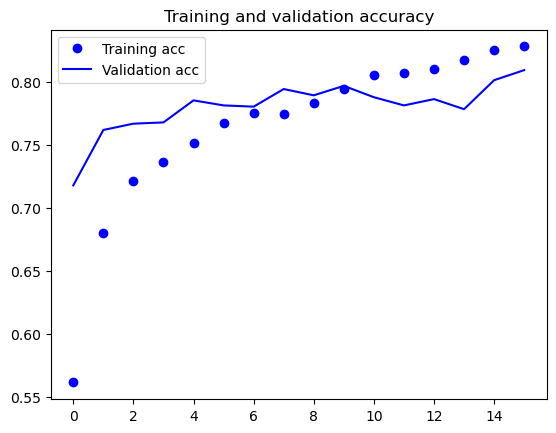

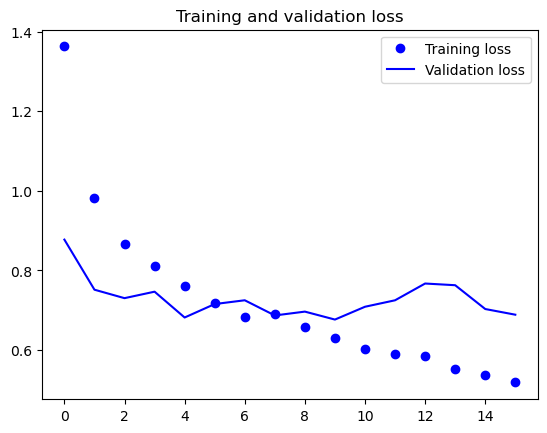

In [32]:
# Plot the Training and Validation Accuracy and Loss Curves
import matplotlib.pyplot as plt
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

In [33]:
# Fine Tuning Stage
conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
    if layer.name == 'block_16': # specifically the last block
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [34]:
model.compile(loss='categorical_crossentropy', # categorical for multi classification
              optimizer=optimizers.RMSprop(learning_rate=2e-5), # no change in learning rate
              metrics=['acc'])
model.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 5, 5, 1280)          │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 32000)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 256)                 │       8,192,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 10)                  │           2,570 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 10,452,810 (39.87 MB)

 Trainable params: 8,194,826 (31.26 MB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [35]:
history = model.fit(
      train_generator,
#       steps_per_epoch=100,
      epochs=16,
      validation_data=validation_generator,
#       validation_steps=50
)

Epoch 1/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 226s 553ms/step - acc: 0.8426 - loss: 0.5051 - val_acc: 0.8010 - val_loss: 0.7093
Epoch 2/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 241s 643ms/step - acc: 0.8336 - loss: 0.4984 - val_acc: 0.8130 - val_loss: 0.7048
Epoch 3/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 234s 622ms/step - acc: 0.8392 - loss: 0.4808 - val_acc: 0.8120 - val_loss: 0.6879
Epoch 4/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 229s 611ms/step - acc: 0.8388 - loss: 0.4685 - val_acc: 0.8065 - val_loss: 0.7004
Epoch 5/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 207s 551ms/step - acc: 0.8508 - loss: 0.4666 - val_acc: 0.8025 - val_loss: 0.7010
Epoch 6/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 248s 662ms/step - acc: 0.8391 - loss: 0.4698 - val_acc: 0.8100 - val_loss: 0.7617
Epoch 7/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 252s 672ms/step - acc: 0.8609 - loss: 0.4352 - val_acc: 0.8045 - val_loss: 0.7081
Epoch 8/16
375/375 ━━━━━━━━━━━━━━━━━━━━ 222s 592ms/step - acc: 0.8592 - loss: 0.4308 - val_acc: 0.8110 - val_loss: 0.7506
Epoch 9/16
375/375 ━━━━━

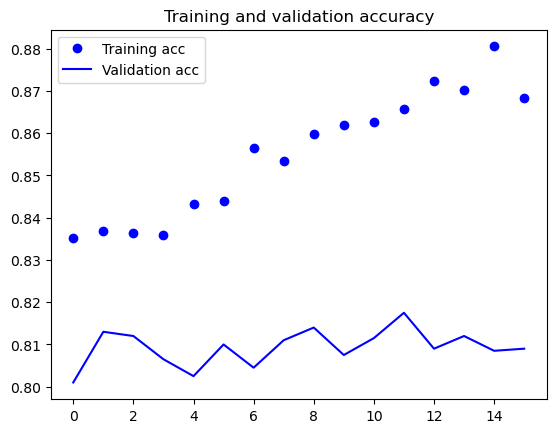

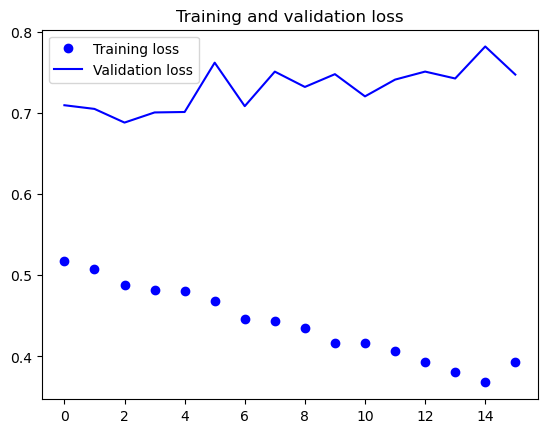

In [36]:
# Plot the Training and Validation Accuracy and Loss Curves
acc = history.history['acc']
val_acc = history.history['val_acc']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.legend()

plt.figure()

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()

plt.show()

## Step 3 – Evaluate the Developed Models using Testing Images (Model 2)

In [37]:
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(150, 150), # no change in image size
    batch_size=20, # same batch size
    class_mode='categorical' # categorical for multi classification
)

test_loss, test_acc = model.evaluate(test_generator, steps=50)
print(f"Test accuracy: {test_acc:.2f}")

Found 500 images belonging to 10 classes.
50/50 ━━━━━━━━━━━━━━━━━━━━ 7s 134ms/step - acc: 0.8216 - loss: 0.7069
Test accuracy: 0.83


C:\Users\tswr1\anaconda3\Lib\contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


In [38]:
# Predict on test data
predictions = model.predict(test_generator)
y_pred = np.argmax(predictions, axis=1)
y_true = test_generator.classes

# Classification Report
class_labels = list(test_generator.class_indices.keys())
print(classification_report(y_true, y_pred, target_names=class_labels))

25/25 ━━━━━━━━━━━━━━━━━━━━ 11s 244ms/step
                precision    recall  f1-score   support

 bread_pudding       0.10      0.12      0.11        50
       churros       0.04      0.04      0.04        50
  deviled_eggs       0.08      0.08      0.08        50
       edamame       0.10      0.10      0.10        50
fish_and_chips       0.07      0.08      0.08        50
grilled_salmon       0.17      0.14      0.15        50
     ice_cream       0.10      0.10      0.10        50
       poutine       0.12      0.10      0.11        50
      takoyaki       0.07      0.08      0.07        50
      tiramisu       0.12      0.12      0.12        50

      accuracy                           0.10       500
     macro avg       0.10      0.10      0.10       500
  weighted avg       0.10      0.10      0.10       500



In [39]:
# Save the Model
model.save('food_model_2.h5')

### Saving the Best Model

In [40]:
# Model #2
model2 = keras.models.load_model('food_model_2.h5')

In [41]:
# Save the best model
model2.save('food_model_best.h5')

## Step 4  – Use the best model to make prediction

In [42]:
# Load the model
model = keras.models.load_model('food_model_best.h5')

In [43]:
# Load the food list (in alphabetical order)
with open('46.txt', 'r') as f: # the 46.txt file which contains a list of food assigned to me
    x = f.readlines()
food_list =[]
for item in x:
    food_list.append(item.strip('\n'))
food_list = sorted(food_list) # food_list needs to be sorted alphabetically before feed into prediction() function
print(food_list)

['bread_pudding', 'churros', 'deviled_eggs', 'edamame', 'fish_and_chips', 'grilled_salmon', 'ice_cream', 'poutine', 'takoyaki', 'tiramisu']


In [44]:
# Define some related functions for image process and model prediction
from tensorflow.keras.preprocessing.image import load_img, img_to_array
def image_process(img): # process inputted image
    image = load_img(img, target_size =(img_size, img_size))
    image_array = img_to_array(image)/255
    return image_array

import pandas as pd
def prediction(model, img_array, items_l): # predict using the best model aka the pre-trained model
    prob = model.predict(img_array.reshape(1,img_size,img_size,3))
    pro_df = pd.DataFrame(prob, columns = items_l)
    result = items_l[np.argmax(prob)]
    return pro_df, result

### Grilled Salmon

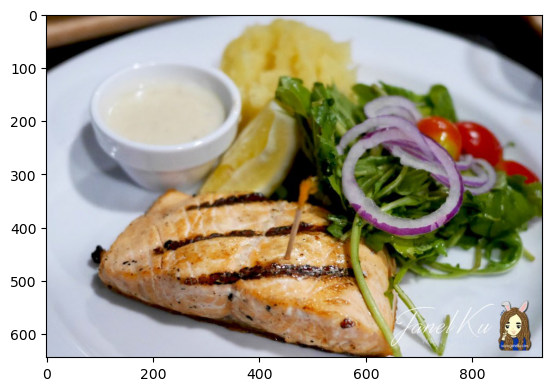

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
The prediction for grilled salmon is:  grilled_salmon 

    bread_pudding   churros  deviled_eggs   edamame  fish_and_chips  \
0   3.179634e-09  0.000016      0.000004  0.000002        0.000296   

   grilled_salmon     ice_cream       poutine      takoyaki      tiramisu  
0        0.999681  8.363685e-12  1.091679e-07  1.058919e-09  2.463063e-07  


In [48]:
# Make prediction for the grilled salmon image you downloaded from internet
import matplotlib.pyplot as plt
img = 'C:/Users/tswr1/OneDrive - Ngee Ann Polytechnic/NP/Y2.2/DL/Assignment 1/grilled-salmon.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction for grilled salmon is: ', result, '\n\n', prob_df)

### Tiramisu

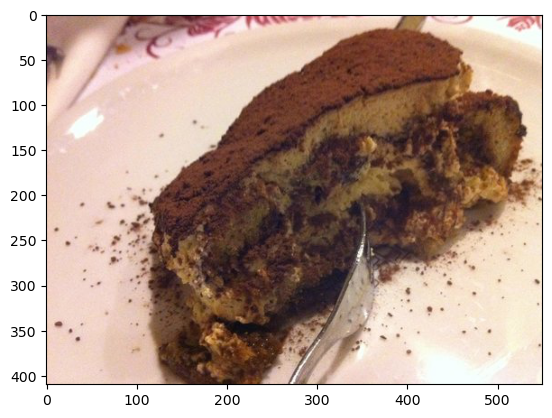

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
The prediction is:  tiramisu 

    bread_pudding       churros  deviled_eggs       edamame  fish_and_chips  \
0       0.000006  1.241144e-08  1.256466e-09  4.366215e-11    2.486168e-10   

   grilled_salmon     ice_cream       poutine      takoyaki  tiramisu  
0         0.04309  9.515732e-07  3.397247e-11  2.567206e-07  0.956902  


In [49]:
# Make prediction for the tiramisu image you downloaded from internet
import matplotlib.pyplot as plt
img = 'C:/Users/tswr1/OneDrive - Ngee Ann Polytechnic/NP/Y2.2/DL/Assignment 1/tiramisu.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The prediction is: ', result, '\n\n', prob_df)

### Bread Pudding

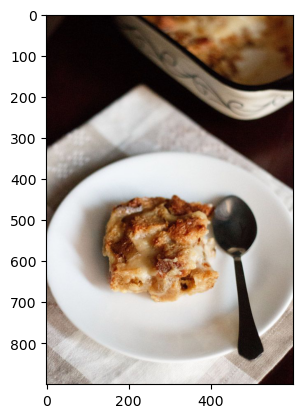

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
The bread pudding prediction is:  bread_pudding 

    bread_pudding   churros  deviled_eggs       edamame  fish_and_chips  \
0       0.538451  0.000332      0.155563  2.684902e-07        0.000016   

   grilled_salmon  ice_cream  poutine  takoyaki  tiramisu  
0        0.000093   0.000002  0.00172  0.295732  0.008092  


In [51]:
# Make prediction for the bread pudding image you downloaded from internet
import matplotlib.pyplot as plt
img = 'C:/Users/tswr1/OneDrive - Ngee Ann Polytechnic/NP/Y2.2/DL/Assignment 1/bread-pudding.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The bread pudding prediction is: ', result, '\n\n', prob_df)

### Poutine

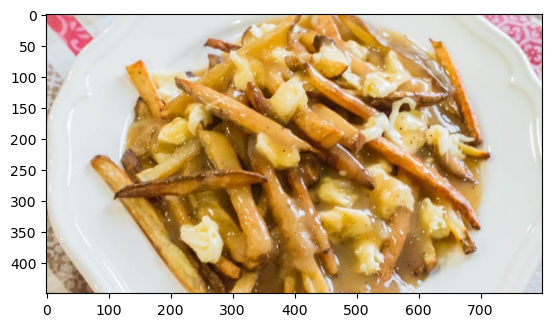

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
The poutine prediction is:  poutine 

    bread_pudding       churros  deviled_eggs   edamame  fish_and_chips  \
0   4.021342e-07  4.506193e-09  2.909860e-10  0.000208        0.000031   

   grilled_salmon     ice_cream   poutine      takoyaki      tiramisu  
0        0.000422  8.152175e-14  0.999339  5.618659e-09  5.817755e-11  


In [54]:
# Make prediction for the poutine image you downloaded from internet
import matplotlib.pyplot as plt
img = 'C:/Users/tswr1/OneDrive - Ngee Ann Polytechnic/NP/Y2.2/DL/Assignment 1/poutine.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The poutine prediction is: ', result, '\n\n', prob_df)

### Ice Cream

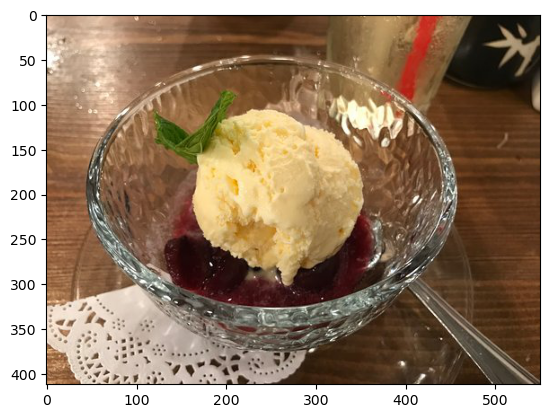

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
The ice cream prediction is:  ice_cream 

    bread_pudding   churros  deviled_eggs       edamame  fish_and_chips  \
0       0.000739  0.000028      0.000003  7.882120e-09        0.000003   

   grilled_salmon  ice_cream       poutine  takoyaki  tiramisu  
0        0.000002   0.991886  3.353460e-08  0.001113  0.006225  


In [55]:
# Make prediction for the ice cream image you downloaded from internet
import matplotlib.pyplot as plt
img = 'C:/Users/tswr1/OneDrive - Ngee Ann Polytechnic/NP/Y2.2/DL/Assignment 1/Ice-Cream.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The ice cream prediction is: ', result, '\n\n', prob_df)

### Takoyaki

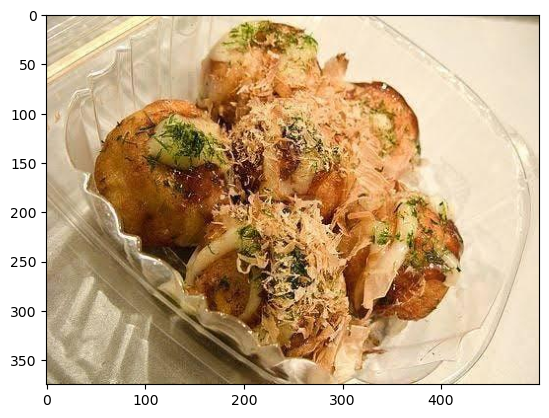

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
The takoyaki prediction is:  takoyaki 

    bread_pudding   churros  deviled_eggs       edamame  fish_and_chips  \
0       0.000248  0.000003      0.000858  2.965632e-10        0.000011   

   grilled_salmon  ice_cream       poutine  takoyaki  tiramisu  
0        0.000209   0.000007  1.393751e-07  0.998652  0.000013  


In [56]:
# Make prediction for the takoyaki image you downloaded from internet
import matplotlib.pyplot as plt
img = 'C:/Users/tswr1/OneDrive - Ngee Ann Polytechnic/NP/Y2.2/DL/Assignment 1/takoyaki.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The takoyaki prediction is: ', result, '\n\n', prob_df)

### Fish and Chips

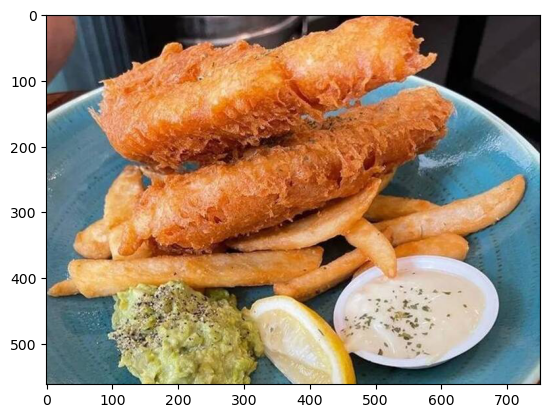

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
The fish and chips prediction is:  fish_and_chips 

    bread_pudding       churros  deviled_eggs       edamame  fish_and_chips  \
0   2.708046e-13  9.270262e-07  4.703623e-11  3.604105e-14        0.999999   

   grilled_salmon     ice_cream       poutine      takoyaki      tiramisu  
0    1.450908e-07  1.272169e-11  1.190398e-13  3.612448e-13  4.881004e-11  


In [57]:
# Make prediction for the fish and chips image you downloaded from internet
import matplotlib.pyplot as plt
img = 'C:/Users/tswr1/OneDrive - Ngee Ann Polytechnic/NP/Y2.2/DL/Assignment 1/fish-and-chips.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The fish and chips prediction is: ', result, '\n\n', prob_df)

### Churros

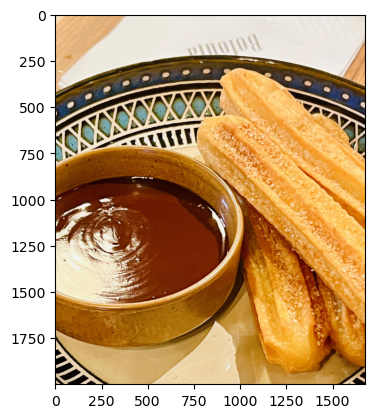

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
The churros prediction is:  churros 

    bread_pudding  churros  deviled_eggs       edamame  fish_and_chips  \
0   1.814381e-13      1.0  1.158071e-15  1.593789e-15    1.903786e-08   

   grilled_salmon     ice_cream       poutine      takoyaki      tiramisu  
0    1.106731e-09  3.074758e-15  2.781360e-18  8.170728e-14  4.586146e-09  


In [59]:
# Make prediction for the churros image you downloaded from internet
import matplotlib.pyplot as plt
img = 'C:/Users/tswr1/OneDrive - Ngee Ann Polytechnic/NP/Y2.2/DL/Assignment 1/churros.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The churros prediction is: ', result, '\n\n', prob_df)

### Deviled eggs

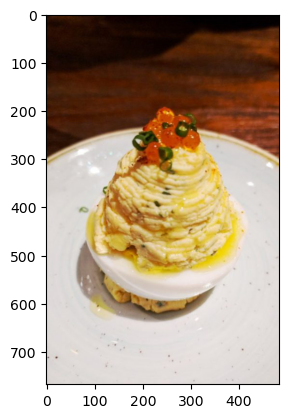

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
The deviled egg prediction is:  deviled_eggs 

    bread_pudding   churros  deviled_eggs       edamame  fish_and_chips  \
0       0.019829  0.000033      0.976802  3.307460e-08    9.943533e-07   

   grilled_salmon  ice_cream   poutine  takoyaki  tiramisu  
0        0.000002   0.000018  0.000299  0.000198  0.002818  


In [60]:
# Make prediction for the deviled eggs image you downloaded from internet
import matplotlib.pyplot as plt
img = 'C:/Users/tswr1/OneDrive - Ngee Ann Polytechnic/NP/Y2.2/DL/Assignment 1/deviled-egg.jpg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The deviled egg prediction is: ', result, '\n\n', prob_df)

### Edamame

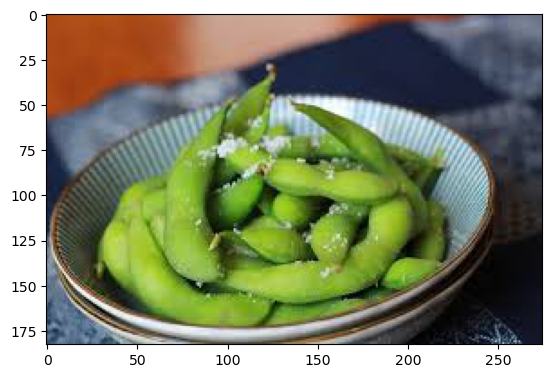

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
The edamame prediction is:  edamame 

    bread_pudding       churros  deviled_eggs   edamame  fish_and_chips  \
0   1.756405e-09  2.163298e-12      0.000005  0.999995    1.932492e-12   

   grilled_salmon     ice_cream       poutine      takoyaki      tiramisu  
0    3.043408e-10  9.036993e-09  4.646791e-13  1.200222e-10  2.817545e-09  


In [61]:
# Make prediction for the edamame image you downloaded from internet
import matplotlib.pyplot as plt
img = 'C:/Users/tswr1/OneDrive - Ngee Ann Polytechnic/NP/Y2.2/DL/Assignment 1/edamame.jpeg' # the picture you downloaded from internet, which contains a type of food in your food list
plt.imshow(plt.imread(img))
plt.show()

img_array = image_process(img)
prob_df, result = prediction(model, img_array, food_list)
print('The edamame prediction is: ', result, '\n\n', prob_df)